# Dataset

#### This dataset is from Kaggle. The dataset can be downloaded and its description can be seen in this link

https://www.kaggle.com/datasets/kumarajarshi/life-expectancy-who

# STEP 1

## Importing Libraries

- Pandas for Data Analysis
- Matplolib and Seaborn for Data Visualization 
- Numpy for scientific computing
- Scikit learn for Machine learning algorithms

In [1]:
#Libraries for data analysis and numerical computation
import pandas as pd
import numpy as np

#Libraries for plotting
import matplotlib.pyplot as plt
import seaborn as sns

#sklearn libraries
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import RobustScaler

In [2]:
#To ignore warnings
import warnings
warnings.filterwarnings('ignore')

# STEP 2

## Exploratory Data Analysis

##### Reading the data

In [3]:
le_df = pd.read_csv("Life_Expectancy_Data.csv")

##### shape gives  the number of rows and columns 

In [4]:
le_df.shape

(2938, 22)

##### First 5 lines of data

In [5]:
le_df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


##### Dependent Variable is Life expectancy (Target), Rest are independent variables

##### the columns in the dataset

In [6]:
le_df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

##### Renaming the columns (converting column names to snake case and removing leading spaces)

In [7]:
le_df = le_df.rename(columns = {'Country':'country','Year':'year','Status':'status','Life expectancy ':'life_expectancy' , 'Adult Mortality':'adult_mortality' , 
                     'infant deaths' : 'infant_deaths' , 'percentage expenditure' : 'percentage_expenditure' , 'Hepatitis B' : 'hepatitis_b',
                     'Measles ' : 'measles', 'BMI ' : 'BMI' , 'under-five deaths ':'under_five_deaths' , 'Total expenditure':'total_expenditure',
                      'Diphtheria ':'diphtheria' , 'Population':'population' ,' HIV/AIDS' : 'HIV/AIDS' , ' thinness  1-19 years' : 'thinness _1-19_years' , 
                     ' thinness 5-9 years' : 'thinness_5-9_years' , 'Income composition of resources' : 'income_composition_of_resources' })

In [8]:
le_df.info() #to see the data type and null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          2938 non-null   object 
 1   year                             2938 non-null   int64  
 2   status                           2938 non-null   object 
 3   life_expectancy                  2928 non-null   float64
 4   adult_mortality                  2928 non-null   float64
 5   infant_deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage_expenditure           2938 non-null   float64
 8   hepatitis_b                      2385 non-null   float64
 9   measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under_five_deaths                2938 non-null   int64  
 12  Polio               

In [9]:
le_df.describe() #description of data

,year,life_expectancy,adult_mortality,infant_deaths,Alcohol,percentage_expenditure,hepatitis_b,measles,BMI,under_five_deaths,Polio,total_expenditure,diphtheria,HIV/AIDS,GDP,population,thinness _1-19_years,thinness_5-9_years,income_composition_of_resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [10]:
le_df.nunique() #Unique values in all columns

country                             193
year                                 16
status                                2
life_expectancy                     362
adult_mortality                     425
infant_deaths                       209
Alcohol                            1076
percentage_expenditure             2328
hepatitis_b                          87
measles                             958
 BMI                                608
under_five_deaths                   252
Polio                                73
total_expenditure                   818
diphtheria                           81
HIV/AIDS                            200
GDP                                2490
population                         2278
thinness _1-19_years                200
thinness_5-9_years                  207
income_composition_of_resources     625
Schooling                           173
dtype: int64

In [11]:
# count of categorical values in status
le_df['status'].value_counts() 

Developing    2426
Developed      512
Name: status, dtype: int64

##### Dealing with duplicates

In [12]:
le_df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2933    False
2934    False
2935    False
2936    False
2937    False
Length: 2938, dtype: bool

In [13]:
#returns the sum of duplicates
le_df.duplicated().sum()

0

##### All the duplicates are removed

### Dealing with null values

df.isnull().sum() gives us the total number of null values in the dataset

In [14]:
#sum of duplicates for each column
le_df.isnull().sum()

country                              0
year                                 0
status                               0
life_expectancy                     10
adult_mortality                     10
infant_deaths                        0
Alcohol                            194
percentage_expenditure               0
hepatitis_b                        553
measles                              0
 BMI                                34
under_five_deaths                    0
Polio                               19
total_expenditure                  226
diphtheria                          19
HIV/AIDS                             0
GDP                                448
population                         652
thinness _1-19_years                34
thinness_5-9_years                  34
income_composition_of_resources    167
Schooling                          163
dtype: int64

##### Let us calculate the null data percentage

In [15]:
(le_df.isnull().sum()/(len(le_df)))*100

country                             0.000000
year                                0.000000
status                              0.000000
life_expectancy                     0.340368
adult_mortality                     0.340368
infant_deaths                       0.000000
Alcohol                             6.603131
percentage_expenditure              0.000000
hepatitis_b                        18.822328
measles                             0.000000
 BMI                                1.157250
under_five_deaths                   0.000000
Polio                               0.646698
total_expenditure                   7.692308
diphtheria                          0.646698
HIV/AIDS                            0.000000
GDP                                15.248468
population                         22.191967
thinness _1-19_years                1.157250
thinness_5-9_years                  1.157250
income_composition_of_resources     5.684139
Schooling                           5.547992
dtype: flo

<AxesSubplot:>

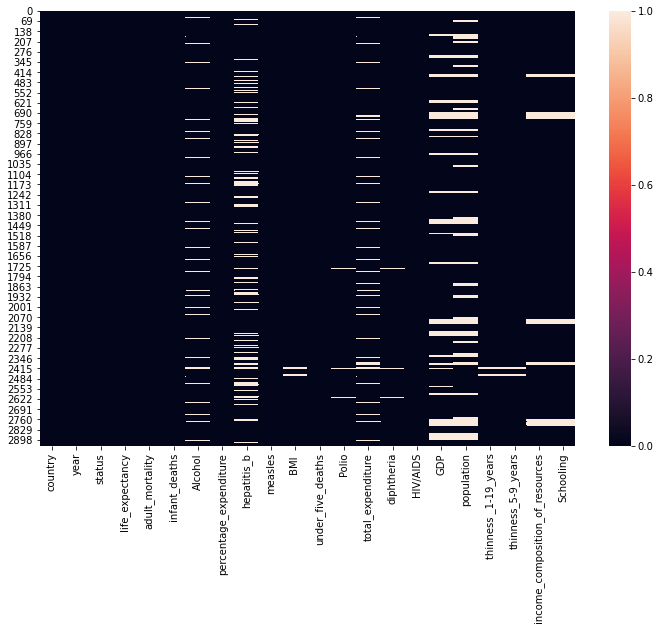

In [17]:
plt.figure(figsize=(12,8))
sns.heatmap(le_df.isnull()) #Null value heatmap

##### As seen above we can see a lot of null values in population, hepatitis_b and gdp cloumns. We can drop the columns if there are more null values. To make sure we are not dropping the important features we are using the heatmap                     

<AxesSubplot:>

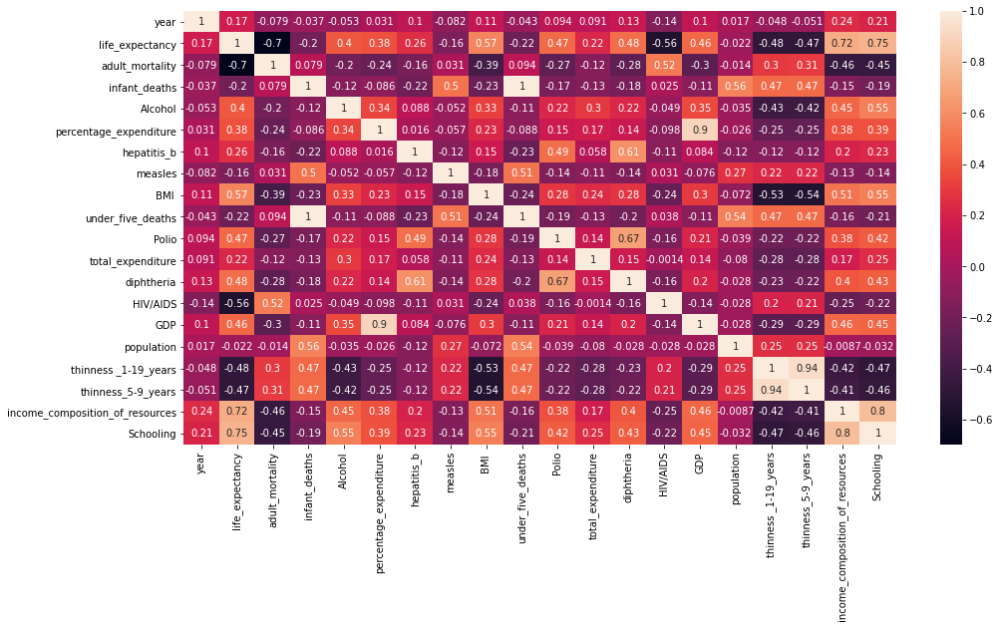

In [18]:
plt.figure(figsize=(16,8))
sns.heatmap(data=le_df.corr(),annot=True)

##### Using the above heatmap we can clearly see that the correlation between population and life expectancy is very low. So we can safely remove it

In [19]:
print("Correlation between Life expectancy and population: ",le_df["life_expectancy"].corr(le_df["population"]))
print("Correlation between Life expectancy and hepatitis_b: ",le_df["life_expectancy"].corr(le_df["hepatitis_b"]))
print("Correlation between Life expectancy and GDP: ",le_df["life_expectancy"].corr(le_df["GDP"]))

Correlation between Life expectancy and population:  -0.021538108386786478
Correlation between Life expectancy and hepatitis_b:  0.2567619476049244
Correlation between Life expectancy and GDP:  0.46145519262073825


In [20]:
le_df.drop(["population"],axis=1,inplace=True)
le_df.head() #To check whether the population column has dropped or not

,country,year,status,life_expectancy,adult_mortality,infant_deaths,Alcohol,percentage_expenditure,hepatitis_b,measles,...,under_five_deaths,Polio,total_expenditure,diphtheria,HIV/AIDS,GDP,thinness _1-19_years,thinness_5-9_years,income_composition_of_resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,83,6.0,8.16,65.0,0.1,584.259210,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,86,58.0,8.18,62.0,0.1,612.696514,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,89,62.0,8.13,64.0,0.1,631.744976,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,93,67.0,8.52,67.0,0.1,669.959000,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,97,68.0,7.87,68.0,0.1,63.537231,18.2,18.2,0.454,9.5


## Dealing with other null values

three methods of dealing with the null values
- Removing the null values
- Replacing it with mean value
- Replacing it with median value

<b>Mean Imputation</b>: If the column <em><b>distribution is normal</b></em>, this imputation can be used
<br>
<b>Median Imputation</b>: If the colum <em><b>distribution is not normal</b></em>, this median imputation can be used

## UniVariate Analysis

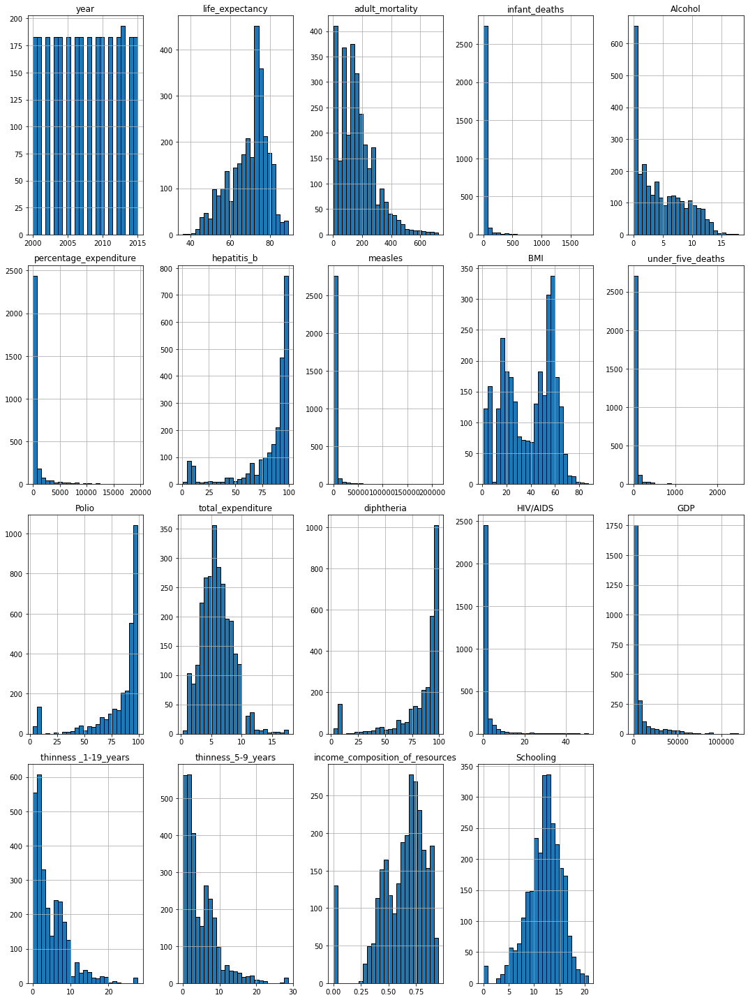

In [21]:
# Plots the histogram for each numerical feature in a separate subplot
le_df.hist(bins=25, figsize=(15, 20), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

##### In the above distribution plot we can see that the data is normally distributed but skewed. So, null values can be replaced with the mean.
<hr>
Let us see the mean of each column which replaces the null values

In [22]:
le_df.mean()

year                               2007.518720
life_expectancy                      69.224932
adult_mortality                     164.796448
infant_deaths                        30.303948
Alcohol                               4.602861
percentage_expenditure              738.251295
hepatitis_b                          80.940461
measles                            2419.592240
 BMI                                 38.321247
under_five_deaths                    42.035739
Polio                                82.550188
total_expenditure                     5.938190
diphtheria                           82.324084
HIV/AIDS                              1.742103
GDP                                7483.158469
thinness _1-19_years                  4.839704
thinness_5-9_years                    4.870317
income_composition_of_resources       0.627551
Schooling                            11.992793
dtype: float64

##### This line of code replaces the data

In [23]:
#null values are replaced by mean
le_df = le_df.fillna(le_df.mean()) 

In [24]:
le_df.head()

,country,year,status,life_expectancy,adult_mortality,infant_deaths,Alcohol,percentage_expenditure,hepatitis_b,measles,...,under_five_deaths,Polio,total_expenditure,diphtheria,HIV/AIDS,GDP,thinness _1-19_years,thinness_5-9_years,income_composition_of_resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,83,6.0,8.16,65.0,0.1,584.259210,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,86,58.0,8.18,62.0,0.1,612.696514,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,89,62.0,8.13,64.0,0.1,631.744976,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,93,67.0,8.52,67.0,0.1,669.959000,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,97,68.0,7.87,68.0,0.1,63.537231,18.2,18.2,0.454,9.5


In [25]:
#Re-check for null values
(le_df.isnull().sum()/(len(le_df)))*100

country                            0.0
year                               0.0
status                             0.0
life_expectancy                    0.0
adult_mortality                    0.0
infant_deaths                      0.0
Alcohol                            0.0
percentage_expenditure             0.0
hepatitis_b                        0.0
measles                            0.0
 BMI                               0.0
under_five_deaths                  0.0
Polio                              0.0
total_expenditure                  0.0
diphtheria                         0.0
HIV/AIDS                           0.0
GDP                                0.0
thinness _1-19_years               0.0
thinness_5-9_years                 0.0
income_composition_of_resources    0.0
Schooling                          0.0
dtype: float64

In [26]:
le_df['status'].value_counts()

Developing    2426
Developed      512
Name: status, dtype: int64

##### Let us check for outliers using boxplots

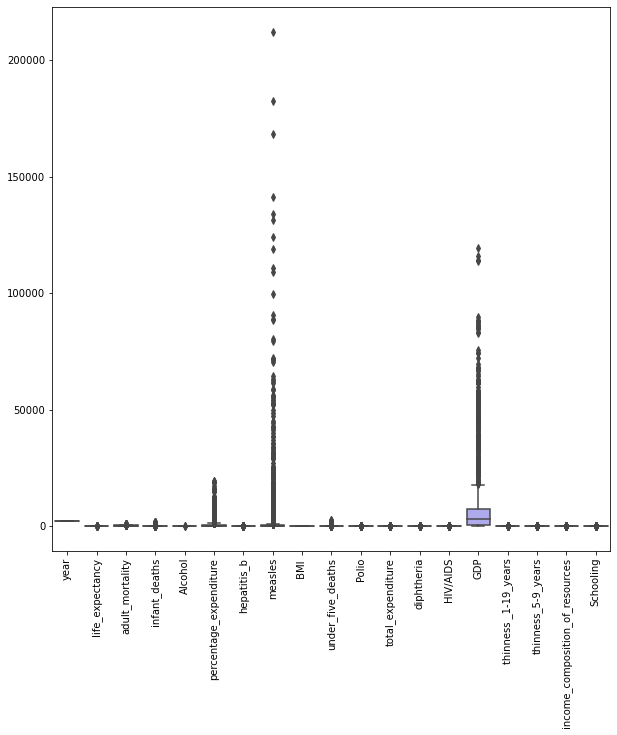

In [27]:
plt.figure(figsize=(10,10))
sns.boxplot(data=le_df)
plt.xticks(rotation=90)
plt.show()

##### Lot of outliers can be seen in the above figure

Let us examine each feature

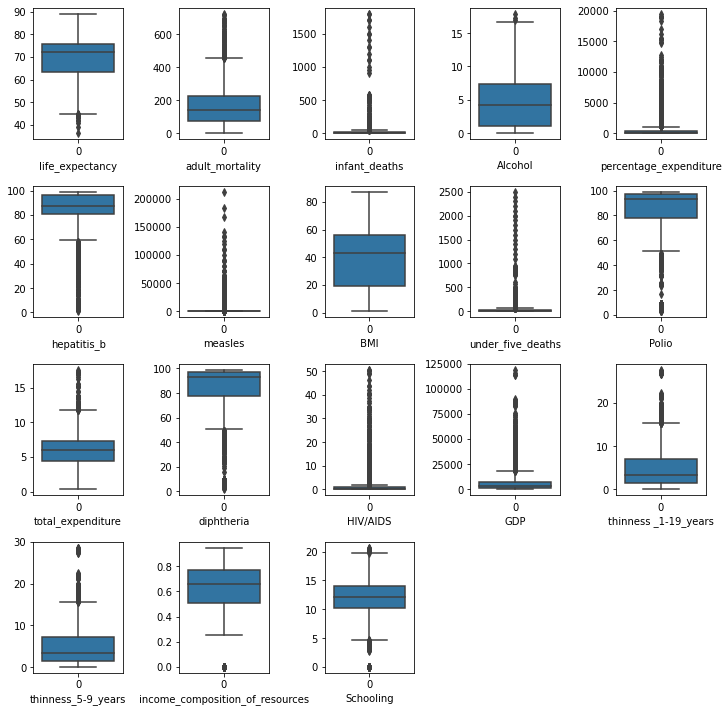

In [28]:
cols = list(le_df.columns)[3:]
plt.figure(figsize = (10,10))
for i in range(len(cols)):
    plt.subplot(4,5,i+1)
    sns.boxplot(data = le_df[cols[i]])
    plt.xlabel(cols[i])
plt.tight_layout()

##### Dealing with outliers

There are two methods to identify outliers
 - Using z-score
 - Using InterQurattile range

Z-score assumes our data to be normal distribution and calculates for the outliers.
<br>
InterQuartile range works for any data. So, our best bet is to use Interquartile range method.

In [29]:
Q1 = le_df.quantile(0.25)
Q3 = le_df.quantile(0.75)
IQR = Q3 - Q1

# Identify the outliers for each column
outliers = ((le_df < (Q1 - 1.5 * IQR)) | (le_df > (Q3 + 1.5 * IQR))).sum()

# Calculate the percentage of outliers for each column
outlier_percentage = outliers / len(le_df) * 100

# Display the results
print('Number of outliers:')
print(outliers)

Number of outliers:
 BMI                                 0
Alcohol                              3
GDP                                300
HIV/AIDS                           542
Polio                              279
Schooling                           77
adult_mortality                     86
country                              0
diphtheria                         298
hepatitis_b                        316
income_composition_of_resources    130
infant_deaths                      315
life_expectancy                     17
measles                            542
percentage_expenditure             389
status                               0
thinness _1-19_years               100
thinness_5-9_years                  99
total_expenditure                   51
under_five_deaths                  394
year                                 0
dtype: int64


In [30]:
print('\nPercentage of outliers:')
print(outlier_percentage)


Percentage of outliers:
 BMI                                0.000000
Alcohol                             0.102110
GDP                                10.211028
HIV/AIDS                           18.447924
Polio                               9.496256
Schooling                           2.620830
adult_mortality                     2.927161
country                             0.000000
diphtheria                         10.142954
hepatitis_b                        10.755616
income_composition_of_resources     4.424779
infant_deaths                      10.721579
life_expectancy                     0.578625
measles                            18.447924
percentage_expenditure             13.240300
status                              0.000000
thinness _1-19_years                3.403676
thinness_5-9_years                  3.369639
total_expenditure                   1.735875
under_five_deaths                  13.410483
year                                0.000000
dtype: float64


### Winsorize

In [31]:
from scipy.stats.mstats import winsorize

In [32]:
print(list(le_df.columns))

['country', 'year', 'status', 'life_expectancy', 'adult_mortality', 'infant_deaths', 'Alcohol', 'percentage_expenditure', 'hepatitis_b', 'measles', ' BMI ', 'under_five_deaths', 'Polio', 'total_expenditure', 'diphtheria', 'HIV/AIDS', 'GDP', 'thinness _1-19_years', 'thinness_5-9_years', 'income_composition_of_resources', 'Schooling']


In [33]:
life_expectancy = winsorize(le_df['life_expectancy'],(0.01,0))
adult_mortality = winsorize(le_df['adult_mortality'],(0,0.03))
infant_deaths = winsorize(le_df['infant_deaths'],(0,0.10))
alcohol = winsorize(le_df['Alcohol'],(0,0.01))
percentage_expenditure = winsorize(le_df['percentage_expenditure'],(0,0.14))
hepatitis_b = winsorize(le_df['hepatitis_b'],(0.11,0))
measles = winsorize(le_df['measles'],(0,0.19))
under_five_deaths = winsorize(le_df['under_five_deaths'],(0,0.12))
polio = winsorize(le_df['Polio'],(0.09,0))
total_expenditure = winsorize(le_df['total_expenditure'],(0,0.01))
diphtheria = winsorize(le_df['diphtheria'],(0.10,0))
HIV = winsorize(le_df['HIV/AIDS'],(0,0.2))
GDP = winsorize(le_df['GDP'],(0,0.13))
thinness_1to19_years = winsorize(le_df['thinness _1-19_years'],(0,0.04))
thinness_5to9_years = winsorize(le_df['thinness_5-9_years'],(0,0.04))
income_composition_of_resources = winsorize(le_df['income_composition_of_resources'],(0.05,0))
Schooling = winsorize(le_df['Schooling'],(0.02,0.01))


In [34]:
le_df["life_expectancy"] = life_expectancy
le_df["adult_mortality"] = adult_mortality
le_df["infant_deaths"] = infant_deaths
le_df["Alcohol"] = alcohol
le_df["percentage_expenditure"] = percentage_expenditure
le_df["hepatitis_b"] = hepatitis_b
le_df["measles"] = measles
le_df["under_five_deaths"] = under_five_deaths
le_df["Polio"] = polio
le_df["total_expenditure"] = total_expenditure
le_df["diphtheria"] =  diphtheria
le_df["HIV/AIDS"] = HIV
le_df["GDP"] = GDP 
le_df['thinness _1-19_years'] = thinness_1to19_years
le_df["thinness_5-9_years"] = thinness_5to9_years
le_df["income_composition_of_resources"] = income_composition_of_resources
le_df["Schooling"] = Schooling

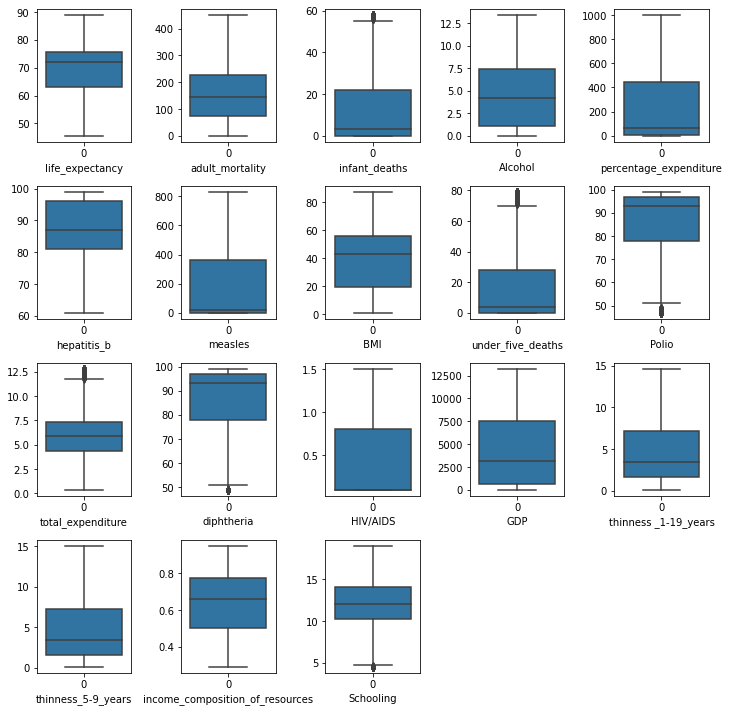

In [35]:
cols = list(le_df.columns)[3:]
plt.figure(figsize = (10,10))
for i in range(len(cols)):
    plt.subplot(4,5,i+1)
    sns.boxplot(data = le_df[cols[i]])
    plt.xlabel(cols[i])
plt.tight_layout()

### Feature Scaling

##### Robust scaler deals with outliers very efficiently, Let us use the same scaler

In [36]:
numeric_cols = le_df.select_dtypes(include='number').columns

In [37]:
print ("list of numeric columns:\n", ", ".join(list(numeric_cols)))

list of numeric columns:
 year, life_expectancy, adult_mortality, infant_deaths, Alcohol, percentage_expenditure, hepatitis_b, measles,  BMI , under_five_deaths, Polio, total_expenditure, diphtheria, HIV/AIDS, GDP, thinness _1-19_years, thinness_5-9_years, income_composition_of_resources, Schooling


In [38]:
from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
scaler.fit(le_df[numeric_cols]) #fits the data
le_df[numeric_cols] = scaler.transform(le_df[numeric_cols]) #Transforms the data

In [39]:
#check the scaled values.
le_df.head() 

,country,year,status,life_expectancy,adult_mortality,infant_deaths,Alcohol,percentage_expenditure,hepatitis_b,measles,...,under_five_deaths,Polio,total_expenditure,diphtheria,HIV/AIDS,GDP,thinness _1-19_years,thinness_5-9_years,income_composition_of_resources,Schooling
0,Afghanistan,0.875,Developing,-0.564516,0.777778,2.5,-0.658992,0.014574,-1.460868,2.259542,...,2.678571,-2.421053,0.750612,-1.473684,0.0,-0.366858,2.036364,2.071429,-0.683473,-0.526316
1,Afghanistan,0.750,Developing,-0.975806,0.830065,2.5,-0.658992,0.019711,-1.660077,1.318529,...,2.678571,-1.842105,0.757368,-1.631579,0.0,-0.362739,2.036364,2.071429,-0.694678,-0.552632
2,Afghanistan,0.625,Developing,-0.975806,0.810458,2.5,-0.658992,0.019014,-1.527271,1.146426,...,2.678571,-1.631579,0.740477,-1.526316,0.0,-0.359979,2.036364,2.071429,-0.717087,-0.578947
3,Afghanistan,0.500,Developing,-1.008065,0.836601,2.5,-0.658992,0.030380,-1.328062,2.259542,...,2.678571,-1.368421,0.872233,-1.368421,0.0,-0.354443,2.036364,2.071429,-0.743231,-0.605263
4,Afghanistan,0.375,Developing,-1.032258,0.856209,2.5,-0.658992,-0.132347,-1.261659,2.259542,...,2.678571,-1.315789,0.652639,-1.315789,0.0,-0.442296,2.036364,2.071429,-0.776844,-0.684211


In [40]:
# There is no much variance in the data
le_df.describe()

,year,life_expectancy,adult_mortality,infant_deaths,Alcohol,percentage_expenditure,hepatitis_b,measles,BMI,under_five_deaths,Polio,total_expenditure,diphtheria,HIV/AIDS,GDP,thinness _1-19_years,thinness_5-9_years,income_composition_of_resources,Schooling
count,2938.00000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000
mean,-0.06016,-0.222423,0.116937,0.497679,0.068194,0.472295,-0.137641,0.565416,-0.127486,0.540261,-0.417910,-0.007344,-0.411466,0.527424,0.217608,0.232202,0.232464,-0.080208,-0.016649
std,0.57673,0.763018,0.752597,0.899902,0.616398,0.831346,0.811691,0.913789,0.542988,0.987548,0.859271,0.784485,0.836602,0.813103,0.651659,0.701055,0.698830,0.639266,0.814266
min,-1.00000,-2.129032,-0.934641,-0.136364,-0.658992,-0.148594,-1.726480,-0.047189,-1.144414,-0.142857,-2.421053,-1.881145,-2.315789,0.000000,-0.451257,-0.600000,-0.589286,-1.385621,-2.000000
25%,-0.50000,-0.709677,-0.457516,-0.136364,-0.487098,-0.137868,-0.402372,-0.047189,-0.643052,-0.142857,-0.789474,-0.529794,-0.789474,0.000000,-0.367405,-0.327273,-0.321429,-0.589169,-0.473684
50%,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.50000,0.290323,0.542484,0.863636,0.512902,0.862132,0.597628,0.952811,0.356948,0.857143,0.210526,0.470206,0.210526,1.000000,0.632595,0.672727,0.678571,0.410831,0.526316
max,0.87500,1.370968,2.013072,2.500000,1.475189,2.147014,0.796837,2.259542,1.207084,2.678571,0.315789,2.308044,0.315789,2.000000,1.466014,2.036364,2.071429,1.068161,1.815789


##### In the above cell we can see that all features are scaled and at the same range which helps the model to reduce bias

### Feature Enginering

##### We have column called status, It is categorical we can convert them in to binary form and use the feature in the data

In [41]:
#developing countries : 1
#developed conutries : 0
le_df=pd.get_dummies(le_df,columns=["status"],drop_first=True)

In [42]:
le_df.head()

,country,year,life_expectancy,adult_mortality,infant_deaths,Alcohol,percentage_expenditure,hepatitis_b,measles,BMI,...,Polio,total_expenditure,diphtheria,HIV/AIDS,GDP,thinness _1-19_years,thinness_5-9_years,income_composition_of_resources,Schooling,status_Developing
0,Afghanistan,0.875,-0.564516,0.777778,2.5,-0.658992,0.014574,-1.460868,2.259542,-0.651226,...,-2.421053,0.750612,-1.473684,0.0,-0.366858,2.036364,2.071429,-0.683473,-0.526316,1
1,Afghanistan,0.750,-0.975806,0.830065,2.5,-0.658992,0.019711,-1.660077,1.318529,-0.664850,...,-1.842105,0.757368,-1.631579,0.0,-0.362739,2.036364,2.071429,-0.694678,-0.552632,1
2,Afghanistan,0.625,-0.975806,0.810458,2.5,-0.658992,0.019014,-1.527271,1.146426,-0.678474,...,-1.631579,0.740477,-1.526316,0.0,-0.359979,2.036364,2.071429,-0.717087,-0.578947,1
3,Afghanistan,0.500,-1.008065,0.836601,2.5,-0.658992,0.030380,-1.328062,2.259542,-0.692098,...,-1.368421,0.872233,-1.368421,0.0,-0.354443,2.036364,2.071429,-0.743231,-0.605263,1
4,Afghanistan,0.375,-1.032258,0.856209,2.5,-0.658992,-0.132347,-1.261659,2.259542,-0.702997,...,-1.315789,0.652639,-1.315789,0.0,-0.442296,2.036364,2.071429,-0.776844,-0.684211,1


In [43]:
le_df.status_Developing.value_counts()

1    2426
0     512
Name: status_Developing, dtype: int64

### After completing of EDA we are using heatmap to check importance of the features with target column

<AxesSubplot:>

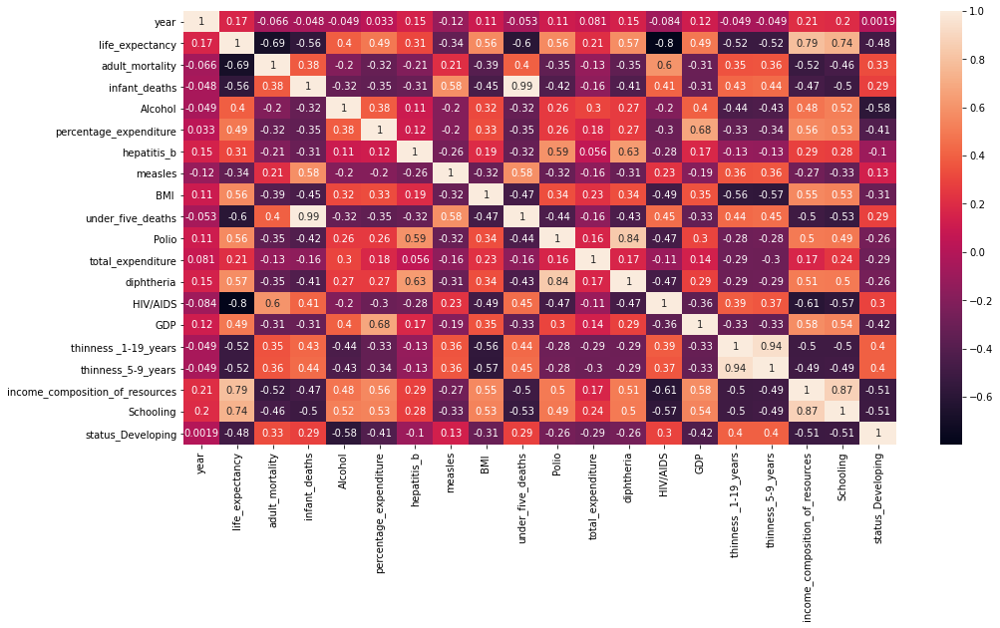

In [44]:
import matplotlib.pyplot as plt
plt.figure(figsize=(16,8))
sns.heatmap(data=le_df.corr(),annot=True)

From the above heatmap, we can see a good correlation between life_expectancy and status_developing, Schooling, Income composition, 

In [45]:
le_df.columns

Index(['country', 'year', 'life_expectancy', 'adult_mortality',
       'infant_deaths', 'Alcohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', ' BMI ', 'under_five_deaths', 'Polio', 'total_expenditure',
       'diphtheria', 'HIV/AIDS', 'GDP', 'thinness _1-19_years',
       'thinness_5-9_years', 'income_composition_of_resources', 'Schooling',
       'status_Developing'],
      dtype='object')

## Bivariate Analysis

We can see in the heapmap that some varibles have more correlation with the life_expectancy than others

### Life expectancy and Status_developing

<AxesSubplot:xlabel='life_expectancy', ylabel='status_Developing'>

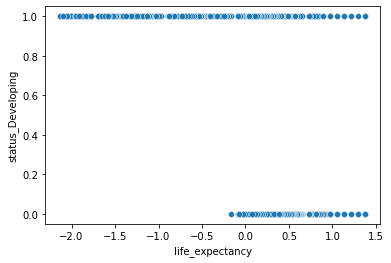

In [46]:
sns.scatterplot(data=le_df,x="life_expectancy",y="status_Developing")

##### Life expectancy is more for developed countries, some of the developing countries life expectancy is low from the above graph

### Life expectancy and Schooling

<AxesSubplot:xlabel='life_expectancy', ylabel='Schooling'>

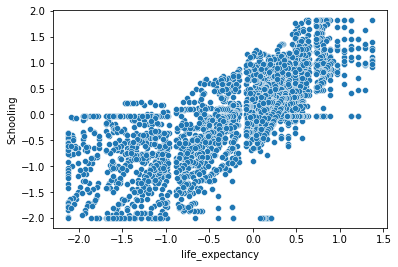

In [47]:
sns.scatterplot(data=le_df,x="life_expectancy",y="Schooling")

##### Linear relationship can be clearly seen from the above graph

### Life expectancy and Income composition of resources

<AxesSubplot:xlabel='life_expectancy', ylabel='income_composition_of_resources'>

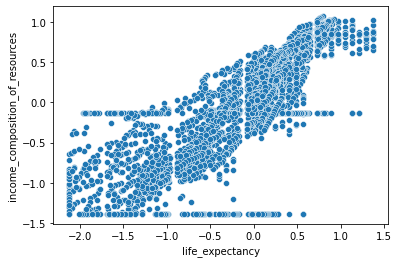

In [48]:
sns.scatterplot(data=le_df,x="life_expectancy",y="income_composition_of_resources")

##### Linear relationship is seen. The life expectancy is increasing with respect to income

### Life Expectancy and HIV/AIDS

<AxesSubplot:xlabel='life_expectancy', ylabel='HIV/AIDS'>

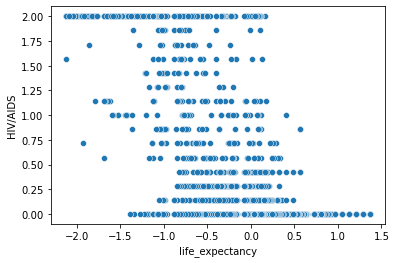

In [49]:
sns.scatterplot(data=le_df,x="life_expectancy",y="HIV/AIDS")

#### People with no HIV/AIDS live longer than the people who has HIV/AIDS 

### Life expectancy and BMI

<AxesSubplot:xlabel='life_expectancy', ylabel=' BMI '>

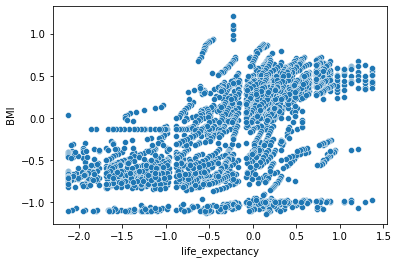

In [50]:
sns.scatterplot(data=le_df,x="life_expectancy",y=" BMI ")

##### Life expectancy is increasing with BMI

### Life Expectancy and Adult Mortality

<AxesSubplot:xlabel='life_expectancy', ylabel='adult_mortality'>

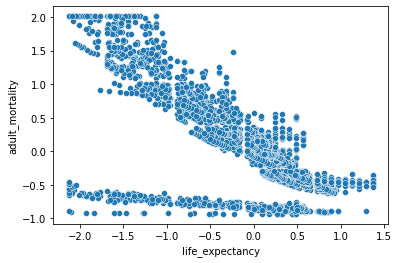

In [51]:
sns.scatterplot(data=le_df,x="life_expectancy",y="adult_mortality")

##### Negative correlation for adult mortality and life expectancy

### Life Expectancy and diptheria

<AxesSubplot:xlabel='life_expectancy', ylabel='diphtheria'>

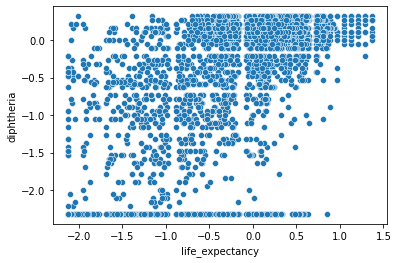

In [52]:
sns.scatterplot(data=le_df,x="life_expectancy",y="diphtheria")

##### The two features can have some correlation but it cannot be seen clearly here

##### Exploration can be done for more features using pair plot, which is shown below

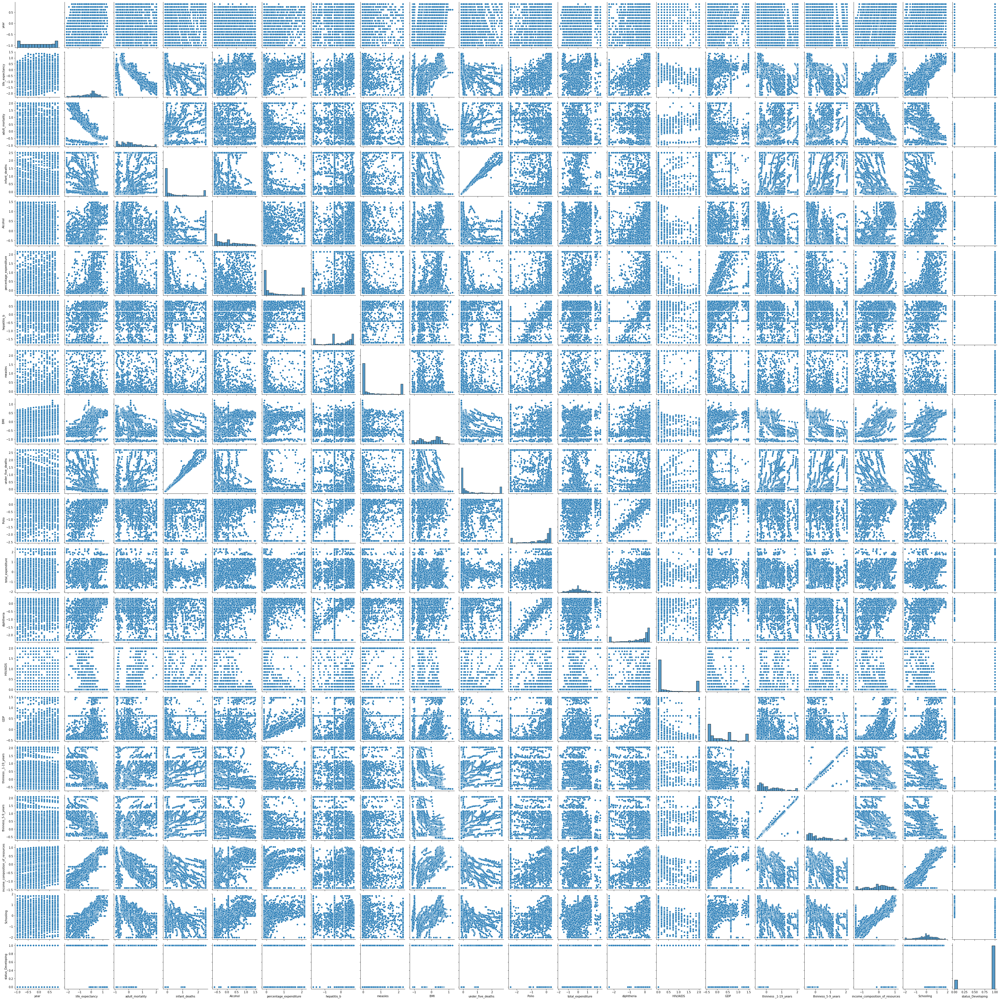

In [53]:
sns.pairplot(le_df)
plt.show()

# STEP3: Train Test Split

## Feature Selection

<AxesSubplot:>

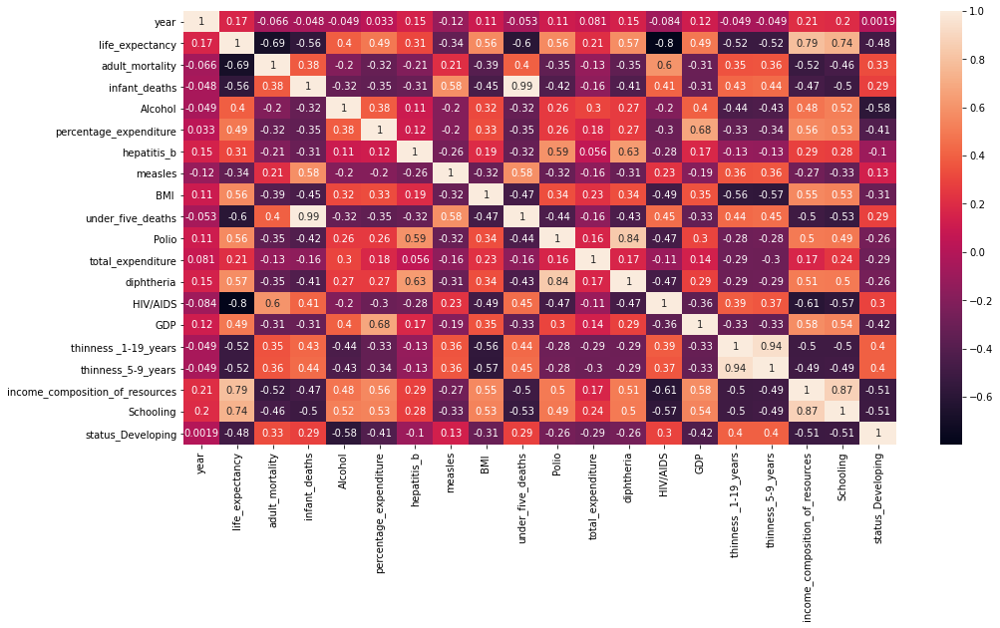

In [54]:
plt.figure(figsize=(16,8))
sns.heatmap(data=le_df.corr(),annot=True)

##### When two features are highly correlated, and one feature has also correlation with target variable, one of them with low correlation with target variable can be dropped. 

Examples: 
- Income composition and Schooling is highly correlated, Income composition has high correlation with target variable. So, drop schooling
- Simlarly thinness can be dropped, percentage_expenditure, Polio, status can be droppes as well

In [55]:
#dependent variable
y=le_df['life_expectancy'] 

le_df.head()

#independent variables (remove target variable also)
le_df.drop(['year', 'country', 'infant_deaths', 'percentage_expenditure','Polio','thinness _1-19_years',
         'Schooling','status_Developing', 'life_expectancy'],axis=1, inplace=True)

X = le_df

In [56]:
print(list(le_df.columns)) #remaining columns in data frame 

['adult_mortality', 'Alcohol', 'hepatitis_b', 'measles', ' BMI ', 'under_five_deaths', 'total_expenditure', 'diphtheria', 'HIV/AIDS', 'GDP', 'thinness_5-9_years', 'income_composition_of_resources']


### Features can be selected using the correlation heatmap, but the efficient way of doing this is using p-value

In [57]:
from sklearn import feature_selection
feature_names = X.columns

# p-value
selector = feature_selection.SelectKBest(score_func = feature_selection.f_regression, k=5).fit(X,y)
pvalue_selected_features = feature_names[selector.get_support()]

print("scores of all the features are", selector.scores_)

scores of all the features are [2679.45917987  543.13311588  303.58249592  377.23509284 1345.88436353
 1629.89434066  139.12805148 1432.28230212 5097.69140744  946.00618266
 1072.40722778 4923.17527804]


### Top five features

In [58]:
print("Top five features that plays important role in this is:\n",)

for i in pvalue_selected_features:
    print (i)

Top five features that plays important role in this is:

adult_mortality
under_five_deaths
diphtheria
HIV/AIDS
income_composition_of_resources


In [59]:
X = le_df [['adult_mortality', 'under_five_deaths', 'diphtheria', 'HIV/AIDS',
       'income_composition_of_resources']]

### Splitting the data into training and testing

In [60]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=0)

# STEP 4

## Applying Machine Learning Models

## Multi Linear Regression

In [61]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

In [62]:
Model_LR = LinearRegression()
Model_LR.fit(X_train,y_train)

LinearRegression()

In [63]:
#predicted values
y_pred= Model_LR.predict(X_test) 

In [64]:
print ("The Intercept is:", Model_LR.intercept_)
print ("The Coefficients are:", Model_LR.coef_ )

The Intercept is: 0.10601666219413705
The Coefficients are: [-0.20948156 -0.12279811  0.08063233 -0.33891046  0.40547406]


Text(0.5, 1.0, 'Actual vs predicted')

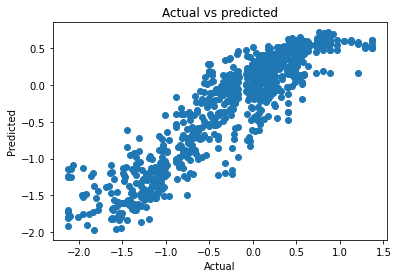

In [65]:
plt.scatter(y_test, y_pred)
plt.xlabel ('Actual')
plt.ylabel ('Predicted')
plt.title ('Actual vs predicted')

In [66]:
Prediction_df= pd.DataFrame({'Actual Value' : y_test, 'Predicted value': y_pred, 'Differences' : y_test - y_pred})
Prediction_df[:10]

,Actual Value,Predicted value,Differences
867,0.427419,0.453527,-0.026108
1780,-0.435484,-0.451415,0.015931
621,-1.564516,-1.449255,-0.115262
2715,-0.846774,-1.090327,0.243553
2717,-0.967742,-1.511531,0.543789
2855,-0.217742,-0.668815,0.451073
1410,-0.072581,0.097256,-0.169837
933,0.766129,0.557090,0.209039
2572,0.185484,0.188552,-0.003068
1376,-1.620968,-1.810103,0.189135


In [67]:
print("Evaluation Metrics for Multi Linear Regression:\n")
print ("R-Squared (R2) score is:", r2_score(y_test, y_pred))
print ("Mean Squared Error (MSE) is:", mean_squared_error(y_test, y_pred))
print ("Mean Absolute Error (MAE) is", mean_absolute_error(y_test,y_pred))

Evaluation Metrics for Multi Linear Regression:

R-Squared (R2) score is: 0.8318435746156746
Mean Squared Error (MSE) is: 0.09633977342888247
Mean Absolute Error (MAE) is 0.23810052070298857


# KNN Regressor

In [68]:
from sklearn.neighbors import KNeighborsRegressor

In [69]:
model_knn = KNeighborsRegressor()
model_knn.fit(X_train,y_train) #fitting the model

KNeighborsRegressor()

In [70]:
y_pred = model_knn.predict(X_test)

Text(0.5, 1.0, 'Actual vs predicted')

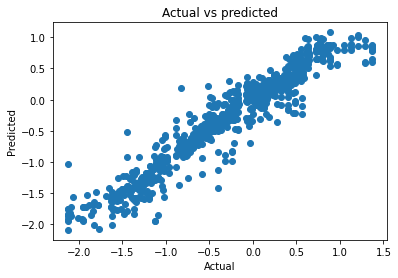

In [71]:
plt.scatter(y_test, y_pred)
plt.xlabel ('Actual')
plt.ylabel ('Predicted')
plt.title ('Actual vs predicted')

In [72]:
print("Evaluation Metrics for KNN Regression:\n")
print ("R-Squared (R2) score is:", r2_score(y_test, y_pred))
print ("Mean Squared Error (MSE) is:", mean_squared_error(y_test, y_pred))
print ("Mean Absolute Error (MAE) is", mean_absolute_error(y_test,y_pred))

Evaluation Metrics for KNN Regression:

R-Squared (R2) score is: 0.9183995869255586
Mean Squared Error (MSE) is: 0.04675031173698879
Mean Absolute Error (MAE) is 0.14403117584068714


### HyperParameter Tuning

##### Hyper Parameter Tuning finds the best parameters that can fit and give the best result. It also performs k-cross validation for finding best results

In [73]:
param_grid = {'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19],
              'weights': ['uniform', 'distance'],
              'p': [1, 2, 3],
              'metric': ['euclidean', 'manhattan', 'chebyshev']}

knn = KNeighborsRegressor()

#Perform grid search for knn model using parameter grid with 5 cross validation
grid_search = GridSearchCV(knn, param_grid, cv=5) 

In [74]:
grid_search.fit(X_train,y_train) #Fitting the model.

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'metric': ['euclidean', 'manhattan', 'chebyshev'],
                         'n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 19],
                         'p': [1, 2, 3], 'weights': ['uniform', 'distance']})

In [75]:
print ("The best parameters after performing grid search is:" , grid_search.best_params_)

The best parameters after performing grid search is: {'metric': 'manhattan', 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}


In [76]:
print ("The best score after performing grid search is:", grid_search.best_score_)

The best score after performing grid search is: 0.9438312196107799


# Random Forest Regressor

In [77]:
from sklearn.ensemble import RandomForestRegressor

In [78]:
model_RF = RandomForestRegressor()
model_RF.fit(X_train,y_train)

RandomForestRegressor()

In [79]:
y_pred = model_RF.predict (X_test)

Text(0.5, 1.0, 'Actual vs predicted')

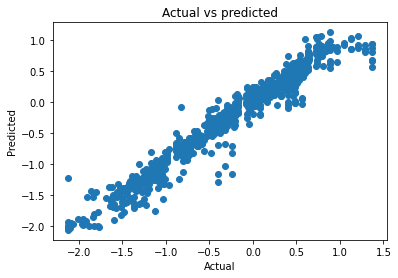

In [80]:
plt.scatter(y_test, y_pred)
plt.xlabel ('Actual')
plt.ylabel ('Predicted')
plt.title ('Actual vs predicted')

In [81]:
print("Evaluation Metrics for Random Forest Regression:\n")
print ("R-Squared (R2) score is:", r2_score(y_test, y_pred))
print ("Mean Squared Error (MSE) is:", mean_squared_error(y_test, y_pred))
print ("Mean Absolute Error (MAE) is", mean_absolute_error(y_test,y_pred))

Evaluation Metrics for Random Forest Regression:

R-Squared (R2) score is: 0.9511371524679557
Mean Squared Error (MSE) is: 0.02799438469013727
Mean Absolute Error (MAE) is 0.10728336078614424


### Hyper Parameter Tuning

In [82]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
import numpy as np

In [83]:
grid_search = GridSearchCV(RandomForestRegressor(random_state=0),
                           {
                              'n_estimators':np.arange(5,100,5),
                              'max_features':np.arange(0.1,1.0,0.05),
                            
                            },cv=5, scoring="r2",verbose=1,n_jobs=-1
                           )
grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 342 candidates, totalling 1710 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0), n_jobs=-1,
             param_grid={'max_features': array([0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 , 0.55, 0.6 ,
       0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95]),
                         'n_estimators': array([ 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85,
       90, 95])},
             scoring='r2', verbose=1)

In [84]:
print("The best parameters found in grid search is:", grid_search.best_params_)

The best parameters found in grid search is: {'max_features': 0.6000000000000002, 'n_estimators': 90}


In [85]:
print ("The best score with hyper parameter tuning is:",grid_search.best_score_)

The best score with hyper parameter tuning is: 0.9556893989853144
